In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns

import math

import plotly 
import plotly.express as px
import json

from shapely.geometry import shape, Point

import regex as re
from nltk import WordNetLemmatizer
from nltk.corpus import stopwords

from textblob import Word

from sklearn.feature_extraction.text import CountVectorizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer

pd.set_option('display.max_columns', None)
style.use('seaborn-whitegrid')

In [2]:
res = pd.read_csv('../data/restaurants.csv')
rev = pd.read_csv('../data/reviews.csv')

## EDA on Restaurant Data

In [3]:
res.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5990 entries, 0 to 5989
Data columns (total 23 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   title        5990 non-null   object 
 1   category     5990 non-null   object 
 2   address      5990 non-null   object 
 3   locatedin    3548 non-null   object 
 4   street       5903 non-null   object 
 5   city         5783 non-null   object 
 6   postalcode   5780 non-null   object 
 7   countrycode  5990 non-null   object 
 8   website      4287 non-null   object 
 9   url          5990 non-null   object 
 10  phone        4688 non-null   object 
 11  permclosed   5990 non-null   bool   
 12  ad           5990 non-null   bool   
 13  score        5314 non-null   float64
 14  placeid      5990 non-null   object 
 15  lat          5990 non-null   float64
 16  lng          5990 non-null   float64
 17  reviewsno    5981 non-null   float64
 18  onestar      5981 non-null   float64
 19  twosta

In [4]:
res.describe()

,score,lat,lng,reviewsno,onestar,twostar,threestar,fourstar,fivestar
count,5314.000000,5990.000000,5990.000000,5981.000000,5981.000000,5981.000000,5981.000000,5981.000000,5981.000000
mean,3.958845,1.341894,103.839149,247.326367,13.666778,9.379201,32.162347,74.548403,117.569637
std,0.583494,0.046789,0.075247,531.936607,22.702640,18.523636,74.626844,171.886754,261.656822
min,1.000000,1.243299,103.623697,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.800000,1.306256,103.787643,9.000000,1.000000,0.000000,1.000000,2.000000,4.000000
50%,4.000000,1.335091,103.842809,83.000000,6.000000,3.000000,9.000000,21.000000,38.000000
75%,4.300000,1.372609,103.889674,287.000000,18.000000,11.000000,36.000000,84.000000,132.000000
max,5.000000,1.469869,104.032031,11278.000000,422.000000,353.000000,1549.000000,4005.000000,5484.000000


In [5]:
len(res['category'].unique())

191

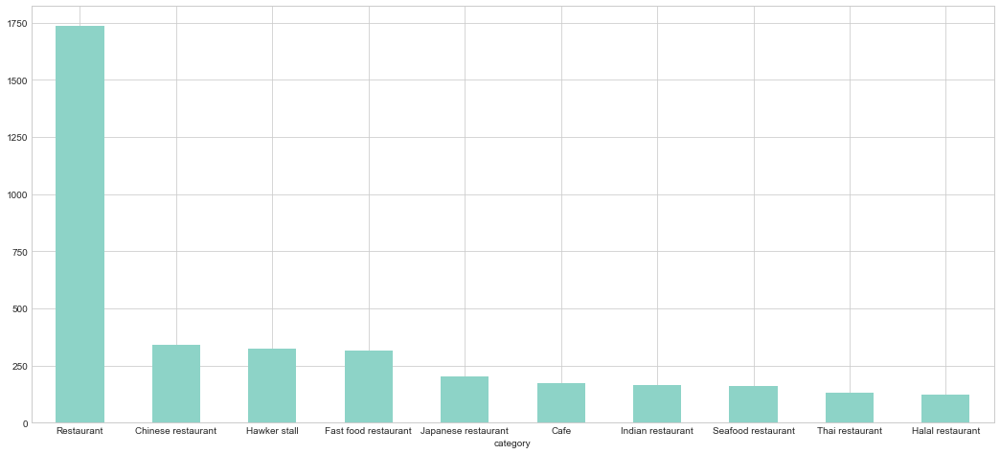

In [6]:
fig = plt.figure(figsize=(18,8))
res.groupby('category')['title'].count().sort_values(ascending=False).head(10).plot(kind='bar', rot=0)
plt.show()

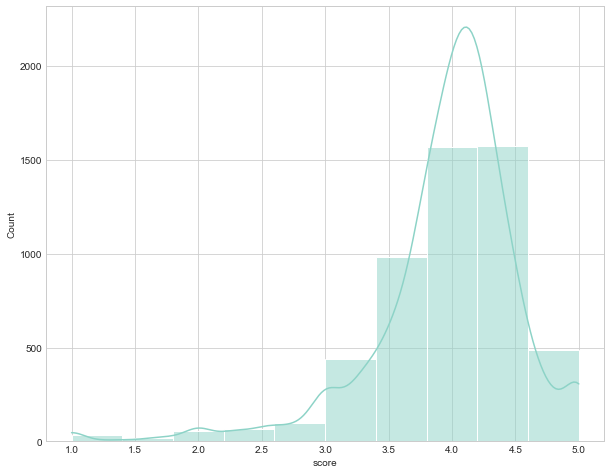

In [7]:
fig = plt.figure(figsize=(10,8))
sns.histplot(res, x='score', bins=10, kde=True)
plt.show()

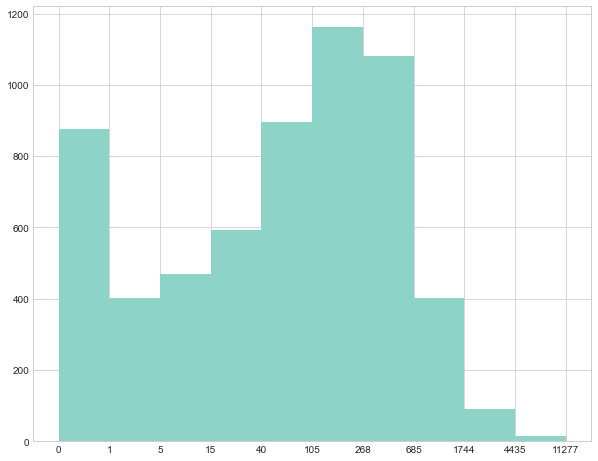

In [8]:
fig = plt.figure(figsize=(10,8))
res['logreviews'] = np.log(res['reviewsno']+1)
hist, bins, _ = plt.hist(res['logreviews'], bins=10)
plt.xticks(bins, (np.exp(bins)-1).astype(int))
plt.show()

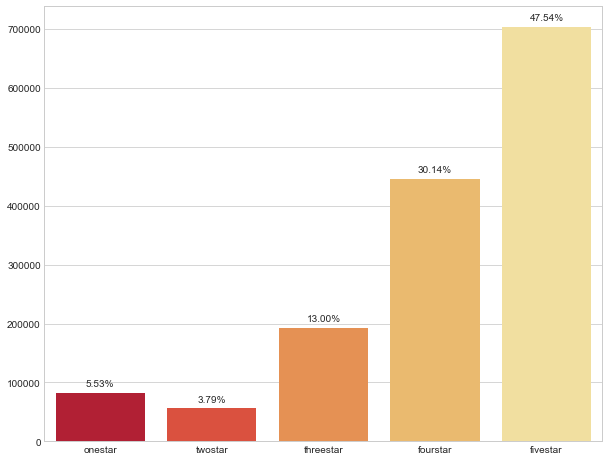

In [9]:
plt.figure(figsize=(10,8))
star_cols = [col for col in res.columns if 'star' in col]
star_sum = res[star_cols].sum()
star_total = np.sum(star_sum)
g = sns.barplot(x=star_sum.index, y=star_sum.values, palette='YlOrRd_r')

for p in g.patches:
    g.annotate(format(p.get_height()/star_total*100, '.2f') + '%', 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

plt.show()

### Geographical Exploration

In [10]:
fig = px.scatter_mapbox(res, lat="lat", lon="lng", hover_name="title", hover_data=["address", "score"],
                        color="score", zoom=10, height=500, width=800)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "source": [
                "https://maps-all.onemap.sg/v3/Default/{z}/{x}/{y}.png"
            ]
        }
      ])

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [11]:
with open('../data/Region_Census2010.geojson') as f:
    regions = json.load(f)
for feature in regions['features']:
    print(feature['properties'])

{'Name': 'CENTRAL REGION', 'description': None, 'X_ADDR': '27836.5342', 'SHAPE_Length': '129974.394117', 'Y_ADDR': '31931.7133', 'Region Name': 'CENTRAL REGION', 'FMEL_UPD_D': '5/6/2014 3:59:13 PM', 'SHAPE': 'Polygon', 'SHAPE_Area': '136347827.16049', 'INC_CRC': 'BDA49A444FE35AA3', 'Field_1': 'CENTRAL REGION'}
{'Name': 'NORTH-EAST REGION', 'description': None, 'X_ADDR': '41561.6792', 'SHAPE_Length': '107338.77172', 'Y_ADDR': '41690.1755', 'Region Name': 'NORTH-EAST REGION', 'FMEL_UPD_D': '5/6/2014 3:59:26 PM', 'SHAPE': 'Polygon', 'SHAPE_Area': '136054594.233341', 'INC_CRC': '51D899B637F87BAF', 'Field_1': 'NORTH-EAST REGION'}
{'Name': 'EAST REGION', 'description': None, 'X_ADDR': '42244.19', 'SHAPE_Length': '60174.653808', 'Y_ADDR': '36763.4372', 'Region Name': 'EAST REGION', 'FMEL_UPD_D': '5/6/2014 3:59:26 PM', 'SHAPE': 'Polygon', 'SHAPE_Area': '112912795.479092', 'INC_CRC': '9A98BBDAF25DCE71', 'Field_1': 'EAST REGION'}
{'Name': 'NORTH REGION', 'description': None, 'X_ADDR': '23660.803

In [12]:
region_df = {
    'CENTRAL REGION': 'Central',
    'NORTH REGION': 'North',
    'NORTH-EAST REGION' :'North-East',
    'EAST REGION': 'East',
    'WEST REGION': 'West',
}
region_df = pd.DataFrame.from_dict(region_df, orient='index', columns=['Region'])
region_df = region_df.reset_index()
region_df.rename(mapper={'index': 'Name'}, axis=1, inplace=True)

In [13]:
colors_dict = {
    'CENTRAL REGION': 'orange',
    'NORTH REGION': 'red',
    'NORTH-EAST REGION' :'purple',
    'EAST REGION': 'green',
    'WEST REGION': 'blue',
}

In [15]:
fig = px.choropleth_mapbox(
        region_df, geojson=regions, color='Name',
        locations='Name', featureidkey="properties.Name", center={'lat': 1.3521, 'lon': 103.8198}, opacity=0.5, zoom=10, color_discrete_map=colors_dict, height=500, width=800)

fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "source": [
                "https://maps-all.onemap.sg/v3/Default/{z}/{x}/{y}.png"
            ]
        }
      ])

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [16]:
lat = res.loc[1, 'lat']
lng = res.loc[1, 'lng']
point = Point(lng, lat)

In [17]:
def get_region(lat, lng):
    point = Point(lng, lat)
    region_name = np.nan
    for feature in regions['features']:
        polygon = shape(feature['geometry'])
        if polygon.contains(point):
            region_name = feature['properties']['Name']
    return region_name

In [18]:
res['region'] = res.apply(lambda x: get_region(x['lat'], x['lng']), axis=1)

In [19]:
res[res['region'].isnull()]

,title,category,address,locatedin,street,city,postalcode,countrycode,website,url,phone,permclosed,ad,score,placeid,lat,lng,reviewsno,onestar,twostar,threestar,fourstar,fivestar,logreviews,region
400,Rasa Istimewa Waterfront Restaurant,Halal restaurant,"6A Admiralty Rd W, Singapore 757445",NaN,6A Admiralty Rd W,Singapore,757445,SG,rasaistimewa.sg,https://www.google.com/maps/place/Rasa+Istimew...,+65 6366 9339,False,False,4.2,ChIJDVTpC_8S2jERSz_upFj7WYo,1.453946,103.777687,1151.0,37.0,22.0,138.0,403.0,551.0,7.049255,NaN
4482,Smith Marine Floating Restaurant,Restaurant,"Johor Strait, Singapore",NaN,Johor Strait,NaN,NaN,SG,smithmarine.com.sg,https://www.google.com/maps/place/Smith+Marine...,+65 9792 7609,False,False,4.1,ChIJX_j8RSs82jERPMzKZZv42i8,1.397021,103.961569,201.0,5.0,10.0,38.0,63.0,85.0,5.308268,NaN
4908,Bones 'n Barrels Sentosa,Restaurant,"Sentosa Broadwalk, Singapore 098072",NaN,Sentosa Broadwalk,Singapore,098072,SG,facebook.com,https://www.google.com/maps/place/Bones+'n+Bar...,+65 6221 0346,False,False,4.1,ChIJeQFPeMgZ2jERnsV_M2E4Ocg,1.260007,103.823374,269.0,25.0,7.0,23.0,72.0,142.0,5.598422,NaN


In [20]:
res.groupby('region').count()['title']

region
CENTRAL REGION       2410
EAST REGION           971
NORTH REGION          649
NORTH-EAST REGION     787
WEST REGION          1170
Name: title, dtype: int64

In [21]:
res.groupby('region').mean()['score']

region
CENTRAL REGION       4.084995
EAST REGION          3.885927
NORTH REGION         3.837990
NORTH-EAST REGION    3.872083
WEST REGION          3.883537
Name: score, dtype: float64

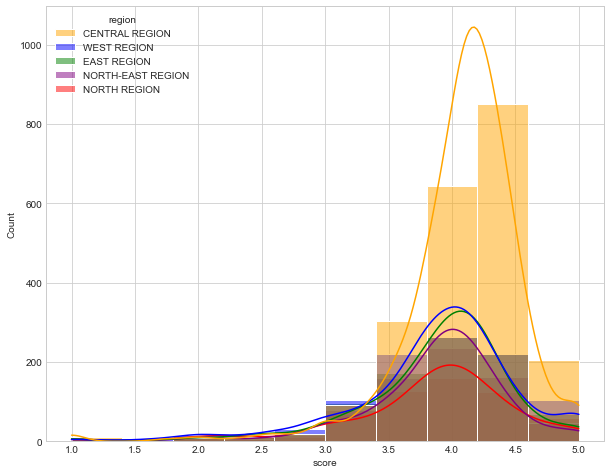

In [22]:
fig = plt.figure(figsize=(10,8))
sns.histplot(res, x='score', hue='region', bins=10, kde=True, palette=colors_dict)
plt.show()

## EDA on Reviews Data

In [3]:
rev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 203990 entries, 0 to 203989
Data columns (total 7 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   title    203990 non-null  object 
 1   placeid  203990 non-null  object 
 2   revname  203990 non-null  object 
 3   revid    203990 non-null  object 
 4   revdate  203990 non-null  object 
 5   revtext  186904 non-null  object 
 6   stars    203990 non-null  float64
dtypes: float64(1), object(6)
memory usage: 10.9+ MB


In [4]:
rev.describe()

,stars
count,203990.000000
mean,3.930149
std,1.303710
min,1.000000
25%,3.000000
50%,4.000000
75%,5.000000
max,5.000000


In [5]:
rev.groupby('stars')['title'].count()

stars
1.0    21026
2.0    10233
3.0    24123
4.0    55190
5.0    93418
Name: title, dtype: int64

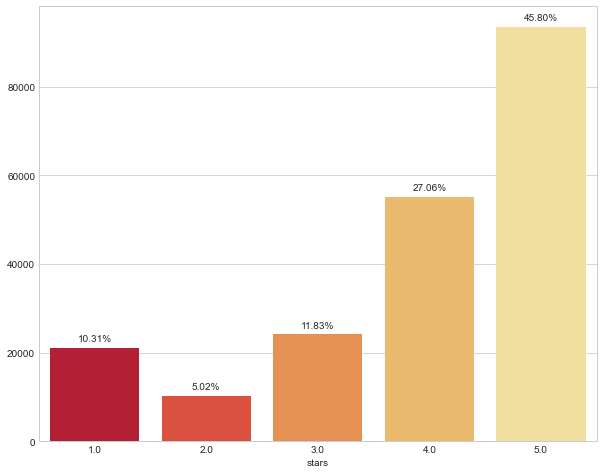

In [6]:
plt.figure(figsize=(10,8))
rev_star_sum = rev.groupby('stars')['title'].count()
rev_star_total = np.sum(rev_star_sum)
g = sns.barplot(x=rev_star_sum.index, y=rev_star_sum.values, palette='YlOrRd_r')

for p in g.patches:
    g.annotate(format(p.get_height()/rev_star_total*100, '.2f') + '%', 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

plt.show()

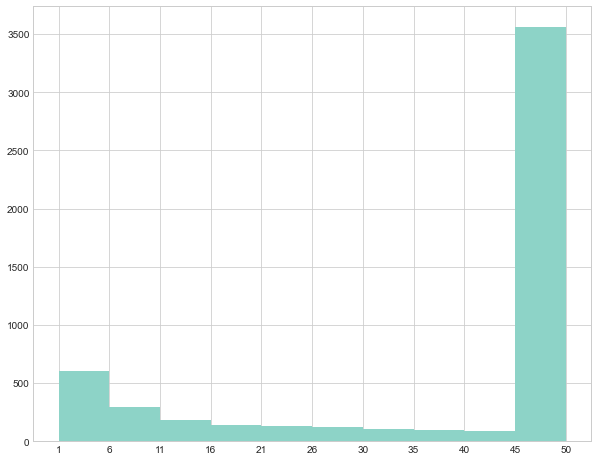

In [7]:
plt.figure(figsize=(10,8))
gb_place = rev.groupby('placeid')['revid'].count().sort_values(ascending=False)
hist, bins, _ = plt.hist(gb_place, bins=10)
plt.xticks(bins, np.round(bins).astype(int))
plt.show()

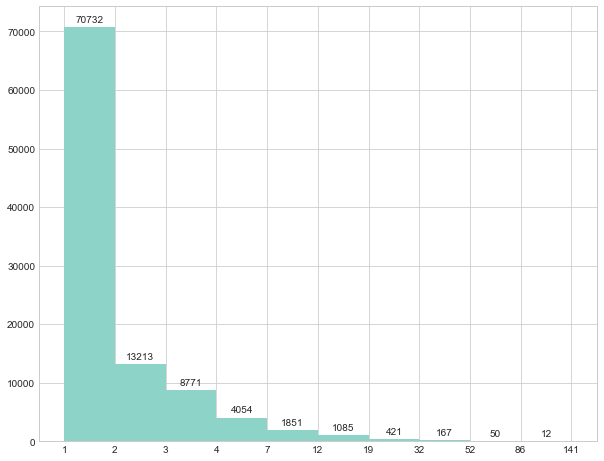

In [8]:
plt.figure(figsize=(10,8))
gb_id = rev.groupby('revid')['revid'].count().sort_values(ascending=False)
gb_id_log = np.log(gb_id)
hist, bins, _ = plt.hist(gb_id_log, bins=10)
plt.xticks(bins, np.round(np.exp(bins)).astype(int))
n = 0
bin_centers = np.diff(bins)*0.5 + bins[:-1]
for fr, x, patch in zip(hist, bin_centers, _):
  height = int(hist[n])
  plt.annotate("{}".format(height),
               xy = (x, height),             # top left corner of the histogram bar
               xytext = (0,3),             # offsetting label position above its bar
               textcoords = "offset points", # Offset (in points) from the *xy* value
               ha = 'center', va = 'bottom'
               )
  n = n+1
plt.show()

In [4]:
rev['revtext'][0]

'The dishes were delicious and the service staff were very attentive. Maybe due to the price point, the restaurant is not as crowded as compared to others when visited during the CNY period. The ambience is definitely better than others.'

In [5]:
stop_words = set(stopwords.words('english'))

In [6]:
def clean_text(text):
    try:
        text = re.sub('\(Translated by Google\)', '', text)
        text = re.sub('\\n', ' ', text)
        text = re.sub('\(Original\).*', '', text)
        text = text.lower()
        text = re.sub('[^A-Za-z0-9\s]+', '', text)
        text = re.sub('\s+', ' ', text)
        text = ' '.join((Word(word).lemmatize() for word in text.split() if word not in stop_words))
        return text
    except:
        return np.nan

In [7]:
clean_text(rev['revtext'][0])

'dish delicious service staff attentive maybe due price point restaurant crowded compared others visited cny period ambience definitely better others'

In [8]:
rev['cleantext'] = rev['revtext'].apply(lambda x: clean_text(x))

In [9]:
def word_count(text):
    try: 
        return len(text.split())
    except:
        return np.nan

In [10]:
rev['wordcount'] = rev['cleantext'].apply(lambda x: word_count(x))

In [11]:
rev.drop(rev[(rev['wordcount']==0) | (rev['wordcount'].isnull())].index, inplace=True)

In [12]:
rev[rev['revtext'].str.contains('Translated')].head(10)

,title,placeid,revname,revid,revdate,revtext,stars,cleantext,wordcount
182,The Eight,ChIJZ9ocfqYZ2jERdtiZlcwKacQ,Mariani Sutanto,110236847942780948778,2019-10-11,(Translated by Google) This restaurant is loca...,5.0,restaurant located pool area fairmont singapor...,86.0
328,A&W® Jurong Point,ChIJ77gI26AP2jERq1jKUIF7afM,Pohboon Yeo,102258065092472992485,2021-03-16,"(Translated by Google) When I was a child, I t...",5.0,child thought rootbeer beer adult drank child ...,21.0
329,A&W® Jurong Point,ChIJ77gI26AP2jERq1jKUIF7afM,Faidzal Nasir,106688620791686809187,2021-03-05,(Translated by Google) Eat!\n\n(Original)\nMakan!,5.0,eat,1.0
330,A&W® Jurong Point,ChIJ77gI26AP2jERq1jKUIF7afM,Yuri Lau,115092629342437436845,2021-02-05,(Translated by Google) Officially opened on 5/...,5.0,officially opened 522021,3.0
517,Silk Road Restaurant - Amara Singapore,ChIJf2VtYGsZ2jERn7tjI3oGGg0,Shin Sasaki,112241711598495473041,2017-04-22,(Translated by Google) 2017.4.22 Revisited\nI ...,5.0,2017422 revisited visited last dinner deliciou...,59.0
518,Silk Road Restaurant - Amara Singapore,ChIJf2VtYGsZ2jERn7tjI3oGGg0,A Nanjo,111715625032920437828,2019-11-19,(Translated by Google) Sichuan restaurant on t...,4.0,sichuan restaurant 2nd floor amara hotel tanjo...,36.0
519,Silk Road Restaurant - Amara Singapore,ChIJf2VtYGsZ2jERn7tjI3oGGg0,Cowboy,117435376145753616038,2019-04-25,(Translated by Google) The mapo tofu here is v...,5.0,mapo tofu delicious expensive,4.0
520,Silk Road Restaurant - Amara Singapore,ChIJf2VtYGsZ2jERn7tjI3oGGg0,umai zarusoba,105413488366894603414,2019-10-16,(Translated by Google) This restaurant serves ...,4.0,restaurant serf mainly sichuan chinese cuisine...,46.0
521,Silk Road Restaurant - Amara Singapore,ChIJf2VtYGsZ2jERn7tjI3oGGg0,Yan Ng,107478119609832696088,2019-10-20,(Translated by Google) Sichuan cuisine with go...,5.0,sichuan cuisine good cospa delicious,5.0
522,Silk Road Restaurant - Amara Singapore,ChIJf2VtYGsZ2jERn7tjI3oGGg0,Yif X,102143796505833548639,2018-06-23,"(Translated by Google) It's delicious, it reta...",5.0,delicious retains original flavor food rare si...,20.0


In [13]:
cvec = CountVectorizer(ngram_range=(1,2), min_df=100)
rev_cv = cvec.fit_transform(rev['cleantext'])
rev_cv = pd.DataFrame(rev_cv.todense(), columns=cvec.get_feature_names())

In [14]:
rev_cv.shape

(186715, 5809)

In [32]:
rev_top = rev_cv.sum().sort_values(ascending=False).head(100).to_frame(name='count')

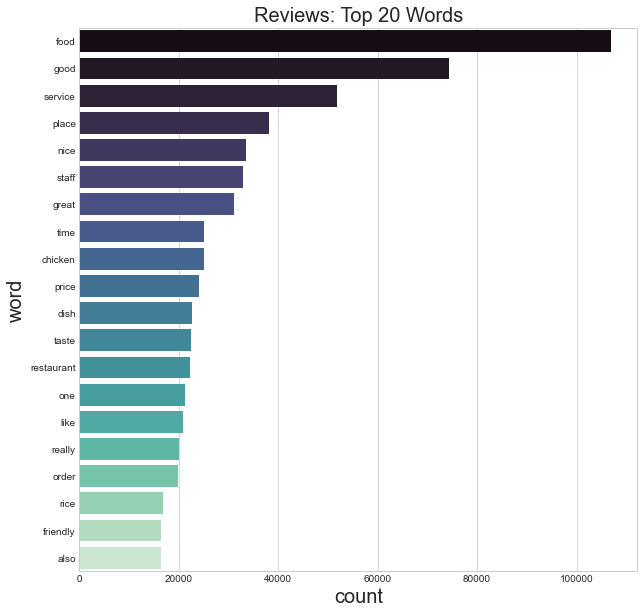

In [23]:
plt.figure(figsize=(10,10))
sns.barplot(data=rev_top.head(20), x='count', y=rev_top.head(20).index,orient='h',palette="mako")
plt.title('Reviews: Top 20 Words',fontsize=20)
plt.xlabel('count',fontsize=20)
plt.ylabel('word',fontsize=20)
plt.show()

In [33]:
rev_top.index

Index(['food', 'good', 'service', 'place', 'nice', 'staff', 'great', 'time',
       'chicken', 'price', 'dish', 'taste', 'restaurant', 'one', 'like',
       'really', 'order', 'rice', 'friendly', 'also', 'well', 'ordered', 'try',
       'soup', 'delicious', 'back', 'would', 'come', 'best', 'quite', 'even',
       'go', 'fried', 'love', 'quality', 'portion', 'fish', 'meal', 'get',
       'table', 'experience', 'definitely', 'menu', 'customer', 'bad',
       'better', 'noodle', 'pork', 'lunch', 'drink', 'fresh', 'worth', 'sauce',
       'served', 'meat', 'tasty', 'ambience', 'still', 'came', 'dont', 'long',
       'much', 'small', 'dinner', 'set', 'beef', 'always', 'recommend',
       'though', 'bit', 'excellent', 'little', 'overall', 'first', 'side',
       'reasonable', 'good food', 'eat', 'visit', 'food good', 'make',
       'friend', 'wait', 'many', 'pretty', 'singapore', 'take', 'star', 'egg',
       'went', 'family', 'must', 'prawn', 'could', 'tried', 'fast', 'stall',
       'decen

In [34]:
rev.to_csv('../data/reviews_clean.csv', index=False)